In [81]:
%pip install tf_keras_vis tflite-support-nightly
!pip install tf-keras-vis

from bing_image_downloader import downloader

import os
import pandas as pd
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import PIL
import PIL.Image
import tensorflow as tf

  Using cached tf_keras_vis-0.8.7-py3-none-any.whl.metadata (10 kB)
Note: you may need to restart the kernel to use updated packages.


ERROR: Ignored the following versions that require a different python version: 0.2.0 Requires-Python >=3.5, <3.8; 0.2.1 Requires-Python >=3.5, <3.8; 0.2.3 Requires-Python >=3.5, <3.8; 0.2.4 Requires-Python >=3.5, <=3.8; 0.2.5 Requires-Python >=3.5, <3.9; 0.3.1 Requires-Python >=3.5, <3.9; 0.3.2 Requires-Python >=3.5, <3.9; 0.3.3 Requires-Python >=3.5, <3.9; 0.4.0 Requires-Python >=3.5, <3.9; 0.5.0 Requires-Python >=3.5, <3.9; 0.5.2 Requires-Python >=3.5, <3.9; 0.5.3 Requires-Python >=3.5, <3.9; 0.5.4 Requires-Python >=3.5, <3.9; 0.5.5 Requires-Python >=3.6, <3.9; 0.6.0 Requires-Python >=3.6, <3.10; 0.6.1 Requires-Python >=3.6, <3.10; 0.6.2 Requires-Python >=3.6, <3.10; 0.7.0 Requires-Python >=3.6, <3.10; 0.7.1 Requires-Python >=3.6, <3.10; 0.7.2 Requires-Python >=3.6, <3.10; 0.8.0 Requires-Python >=3.6, <3.10; 0.8.1 Requires-Python >=3.7, <3.11
ERROR: Could not find a version that satisfies the requirement tflite-support-nightly (from versions: none)
ERROR: No matching distribution fou

  Using cached tf_keras_vis-0.8.7-py3-none-any.whl.metadata (10 kB)
   ---------------------------------------- 0.0/52.5 kB ? eta -:--:--
   ------- -------------------------------- 10.2/52.5 kB ? eta -:--:--
   ------- -------------------------------- 10.2/52.5 kB ? eta -:--:--
   ------------------------------- -------- 41.0/52.5 kB 330.3 kB/s eta 0:00:01
   ---------------------------------------- 52.5/52.5 kB 388.2 kB/s eta 0:00:00
   ---------------------------------------- 0.0/313.5 kB ? eta -:--:--
   ----- ---------------------------------- 41.0/313.5 kB 1.9 MB/s eta 0:00:01
   --------------- ------------------------ 122.9/313.5 kB 1.4 MB/s eta 0:00:01
   -------------------------------- ------- 256.0/313.5 kB 2.0 MB/s eta 0:00:01
   ---------------------------------------- 313.5/313.5 kB 1.9 MB/s eta 0:00:00


# Create your dataset

1) Choose which classes you would like to add.

2) Create a dataset with your own photos

3) Separate your dataset into train and test subsets.

In [2]:
QUERIES = [
    "Chess King", "Chess Queen", "Chess Rook",
    "Chess Bishop", "Chess Knight", "Chess Pawn"
]
OUTPUT_DIR_BASE = '/dataset_images'
NB_IMAGES = 50

#for query in QUERIES:
#    downloader.download(
#        query, limit = NB_IMAGES,  output_dir=OUTPUT_DIR_BASE,
#        adult_filter_off=False, force_replace=False, timeout=15
#    )

In [3]:
#lABEL_PATH = 'labels.txt'
TRAINING_DATASET_PATH = 'dataset_images/training_dataset/'
TEST_DATASET_PATH = 'dataset_images/test_dataset/'

In [4]:
#LABEL_NAMES = []
#with open(lABEL_PATH) as f:
#    LABEL_NAMES = f.read().split('\n')
#NB_CLASSES = len(LABEL_NAMES)
#LABEL_NAMES
#QUERIES = [
#   "Chess King", "Chess Queen", "Chess Rook",
#    "Chess Bishop", "Chess Knight", "Chess Pawn",
#]

In [5]:
import os
import pandas as pd
from glob import glob

path = OUTPUT_DIR_BASE

def create_dataframe_from_directories(path):
    data = []

    for label_dir in os.listdir(path):
        if os.path.isfile(label_dir):
            continue

        label_path_path = os.path.join(path, label_dir)
        for file in os.listdir(label_path_path):
            data.append([os.path.join(label_path_path, file), label_dir])
        
    return pd.DataFrame(data, columns = ["path", "label"])

In [6]:
train_df = create_dataframe_from_directories(TRAINING_DATASET_PATH)
train_df

,path,label
0,dataset_images/training_dataset/Chess Bishop\I...,Chess Bishop
1,dataset_images/training_dataset/Chess Bishop\I...,Chess Bishop
2,dataset_images/training_dataset/Chess Bishop\I...,Chess Bishop
3,dataset_images/training_dataset/Chess Bishop\I...,Chess Bishop
4,dataset_images/training_dataset/Chess Bishop\I...,Chess Bishop
...,...,...
240,dataset_images/training_dataset/Chess Rook\Ima...,Chess Rook
241,dataset_images/training_dataset/Chess Rook\Ima...,Chess Rook
242,dataset_images/training_dataset/Chess Rook\Ima...,Chess Rook
243,dataset_images/training_dataset/Chess Rook\Ima...,Chess Rook


In [7]:
test_df = create_dataframe_from_directories(TEST_DATASET_PATH)
test_df

,path,label
0,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop
1,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop
2,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop
3,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop
4,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop
5,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop
6,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop
7,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop
8,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop
9,dataset_images/test_dataset/Chess Bishop\Image...,Chess Bishop


In [8]:
LABEL_NAMES = pd.unique(train_df['label'])
LABEL_NAMES

array(['Chess Bishop', 'Chess King', 'Chess Knight', 'Chess Pawn',
       'Chess Queen', 'Chess Rook'], dtype=object)

**TODO**: Display some images of your dataset

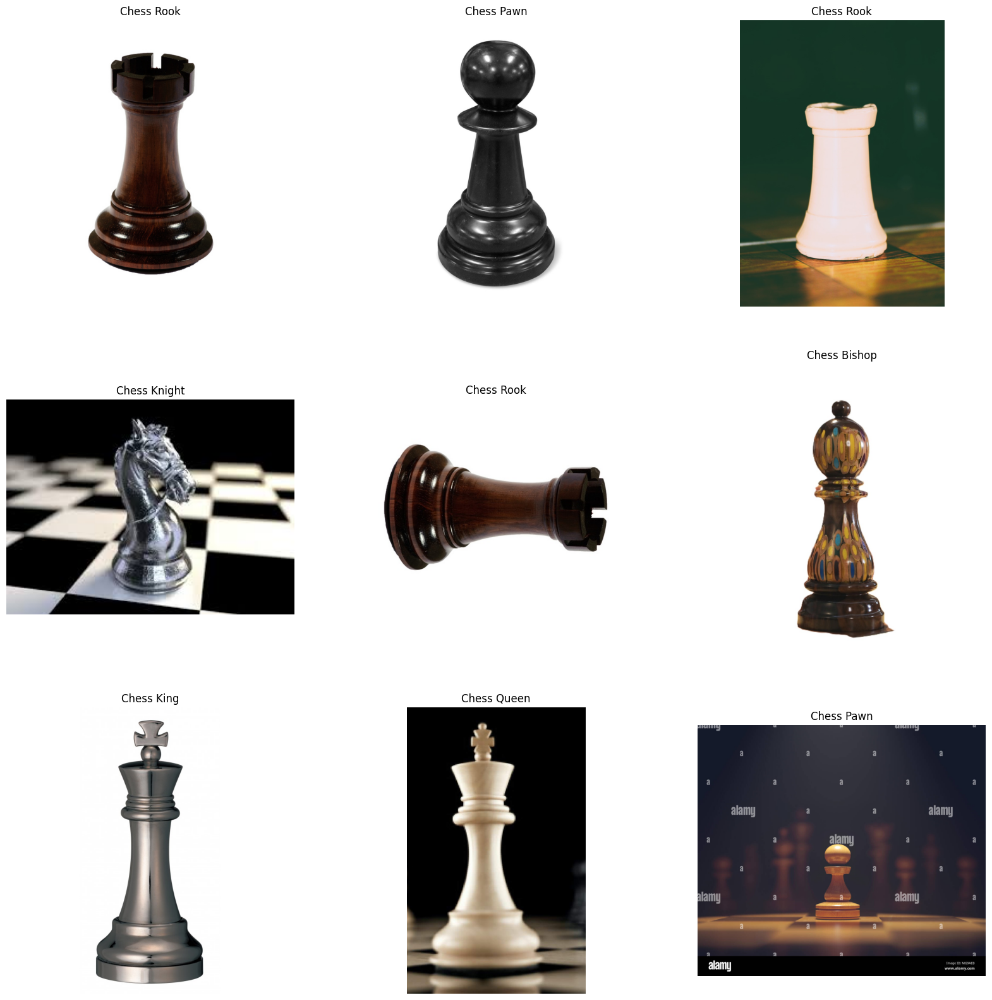

In [20]:
import matplotlib.pyplot as plt
import PIL
import PIL.Image

def show_images(images): 
    plt.figure(figsize=(20, 20))

    i = 0
    for _, rowdata in train_df.sample(frac=1).head(9).iterrows():
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(PIL.Image.open(rowdata.path))
        plt.title(rowdata.label)
        plt.axis("off")
        i += 1

show_images(train_df)

# Explore your dataset

**TODO**: count the number of examples per classes and plot an histogram of it

In [10]:
def create_histogram(train, test):
    df1 = train.groupby('label').count()
    df2 = test.groupby('label').count()
    df = pd.merge(df1, df2, on='label')
    
    return df.plot.bar(title="Nombre d'images par classe",
                       xlabel='Classe',
                       ylabel="Nombre d'images").legend(["Train", "Test"])

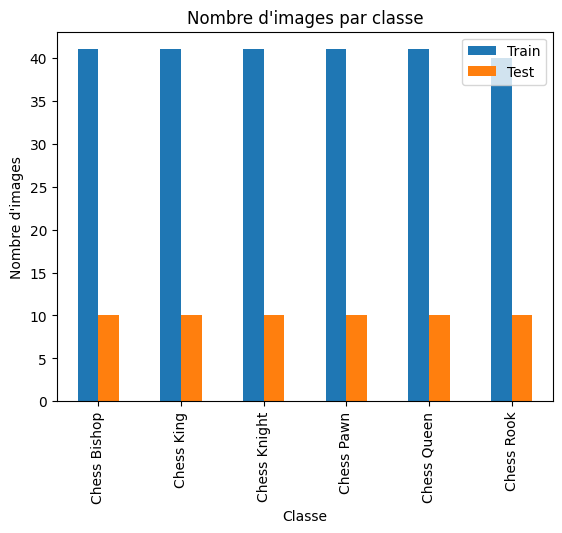

In [11]:
create_histogram(train_df, test_df)

# Preprocessing steps

In [58]:
import matplotlib.pyplot as plt
import PIL
import PIL.Image
import numpy as np
import pandas as pd
from tensorflow.keras.layers import Resizing, Rescaling, RandomFlip, RandomRotation, RandomZoom, RandomContrast
from tensorflow.keras import Sequential

from tensorflow.keras.layers import (
    Resizing, Rescaling,
)

from tensorflow.keras import Sequential

IMG_HEIGHT = 224
IMG_WIDTH = 224

image_preprocesses = Sequential([
    Resizing(IMG_HEIGHT, IMG_WIDTH, crop_to_aspect_ratio=True),
    Rescaling(1. / 255)
])

image_augmentations = Sequential([
    # TODO: choose some image augmentations layers
    # see which keras layers you can use
    # The kind of layers you will want to use starts with "Random".
    # See the following page for more information on data augmentation :
    # https://www.tensorflow.org/tutorials/images/data_augmentation
    RandomFlip("horizontal_and_vertical"),  # Applique un retournement aléatoire horizontal et vertical
    RandomRotation(0.2),  # Tourne les images de -20% à +20% des 360 degrés
    RandomZoom(0.2),  # Zoom aléatoire jusqu'à 20%
    RandomContrast(0.2)  # Ajuste le contraste de l'image de manière aléatoire dans l'intervalle spécifié
])

def open_image(path):
    with PIL.Image.open(path) as image:
        image = image.convert("RGB")  # Assurez-vous que l'image est en RGB
        image_array = np.array(image)
        image_resized = image_preprocesses(np.expand_dims(image_array, axis=0))
        return np.squeeze(image_resized, axis=0)

def open_images(paths):
    images = []
    for path in paths:
        images.append(open_image(path))
    return np.stack(images)

def augment_images(images):
    augmented_images = []
    for img in images:
        augmented_image = image_augmentations(np.expand_dims(img, axis=0))
        augmented_images.append(np.squeeze(augmented_image, axis=0))
    return np.stack(augmented_images)

**TODO**: plot examples of preprocessed and augmented images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


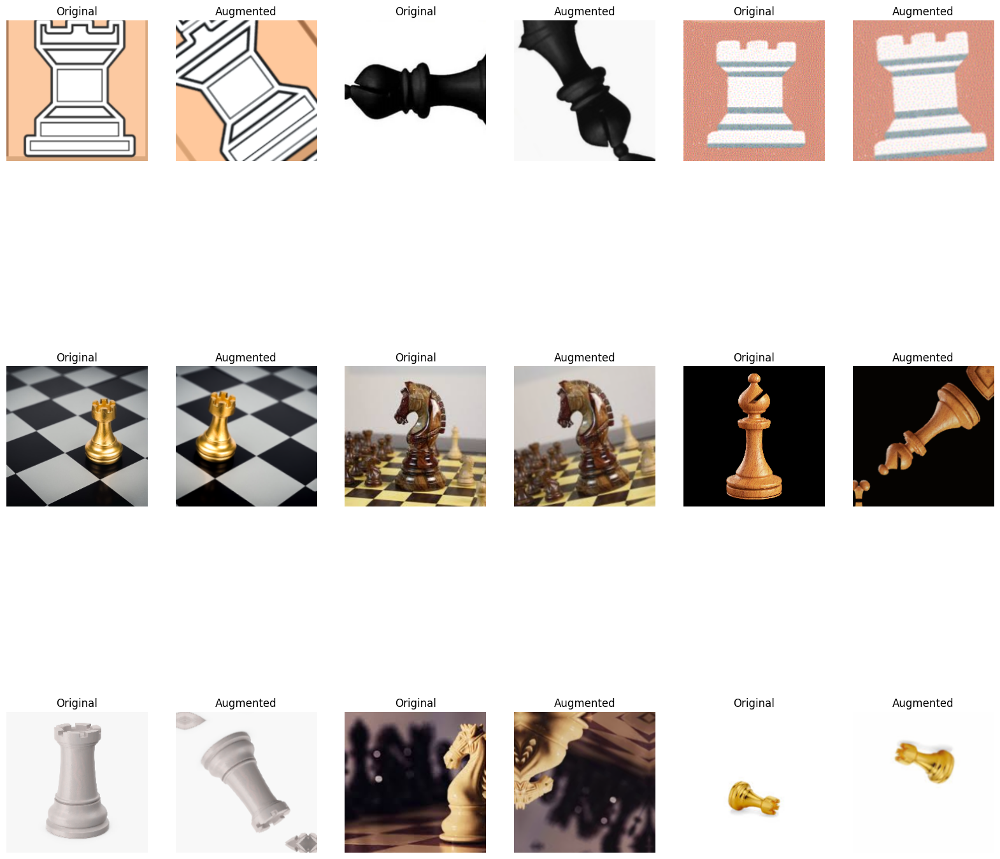

In [59]:
def plot_preprocessed_and_augmented_images(paths):
    images = open_images(paths)
    augmented_images = augment_images(images)
    
    plt.figure(figsize=(20, 20))
    for i in range(len(paths)):
        ax = plt.subplot(3, 6, 2*i + 1)
        plt.imshow(images[i])
        plt.title("Original")
        plt.axis("off")
        
        ax = plt.subplot(3, 6, 2*i + 2)
        plt.imshow(augmented_images[i])
        plt.title("Augmented")
        plt.axis("off")
    plt.show()

# Sélectionner aléatoirement 9 chemins d'images à partir de train_df
sample_paths = train_df['path'].sample(9).tolist()
plot_preprocessed_and_augmented_images(sample_paths)

## Define model

In [61]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras import Model
from tensorflow.keras.layers import (
    GlobalAveragePooling2D,
    Dense,
    Dropout
)

def get_model():
    base_model = MobileNetV2(
        input_shape=(224, 224, 3),
        weights='imagenet',
        include_top=False
    )
    
    layers = base_model.output

    added_layers = [
        # important, we need global average pooling instead of flatten for class activation map later on 
        GlobalAveragePooling2D(), 
        # TODO: ...
        Dropout(0.2),
        Dense(128, activation='relu'),
        Dropout(0.2),
        Dense(6, activation='softmax')
    ]

    model = Model(inputs=base_model.input, outputs=Sequential(added_layers)(layers))

    # TODO: freeze layers
    for layer in base_model.layers:
        layer.trainable = False
    
    model.compile(
      optimizer = RMSprop(),
      loss = SparseCategoricalCrossentropy(),
      metrics = ['acc']
    )
        
    return model

In [62]:
get_model().summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_14[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,726 (9.24 MB)

 Trainable params: 164,742 (643.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

# Model training

**TODO**: cross-validate your model, you can base yourself on the code from the first part of this practical work

**NOTE**: you shouldn't augment validations images. What we want to evaluate is the performances on "real" images, not on images that are augmented and change all the time 

In [63]:
import numpy as np
import tensorflow as tf
import sklearn
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

shuffled_dataset = train_df.sample(frac=1, random_state=1234).reset_index(drop=True)

dataset_paths = shuffled_dataset['path'].to_numpy()
dataset_labels = shuffled_dataset['label'].to_numpy()

total_train_paths, test_paths, total_train_labels, test_labels = train_test_split(
    dataset_paths, dataset_labels, test_size=0.2, random_state=1234
)

# We need to convert from string labels to integers
label_encoder = LabelEncoder()
label_encoder.fit(dataset_labels)
total_train_labels = label_encoder.transform(total_train_labels)
test_labels = label_encoder.transform(test_labels)

NB_EPOCHS = 5

train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

for train_index, val_index in KFold(n_splits=5).split(total_train_paths, total_train_labels):
    train_images = augment_images(open_images(total_train_paths[train_index]))
    train_labels = total_train_labels[train_index]
    
    val_images = open_images(total_train_paths[val_index])
    val_labels = total_train_labels[val_index]
    
    model = get_model()  # Réinitialiser le modèle
    
    history = model.fit(
        x=train_images,
        y=train_labels,
        batch_size=32,
        validation_data=(val_images, val_labels),
        epochs=NB_EPOCHS,
    )
    
    train_losses.append(history.history['loss'])
    val_losses.append(history.history['val_loss'])
    train_accuracies.append(history.history['acc'])
    val_accuracies.append(history.history['val_acc'])

C:\Users\camko\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\PIL\Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - acc: 0.1796 - loss: 2.5648 - val_acc: 0.3750 - val_loss: 1.6122
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 605ms/step - acc: 0.4495 - loss: 1.3555 - val_acc: 0.3500 - val_loss: 1.4849
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 622ms/step - acc: 0.5625 - loss: 1.1055 - val_acc: 0.3000 - val_loss: 1.5688
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 562ms/step - acc: 0.7367 - loss: 0.7946 - val_acc: 0.4500 - val_loss: 1.4423
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 628ms/step - acc: 0.7214 - loss: 0.7099 - val_acc: 0.4500 - val_loss: 1.4310
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - acc: 0.1557 - loss: 2.6672 - val_acc: 0.2051 - val_loss: 1.9672
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 540ms/step - acc: 0.4044 - loss: 1.4921 - val_acc: 0.4103 - val_loss: 1.6070
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 550ms/step - acc: 0.6856 - loss: 1.0200 - val_acc: 0.4359 - val_loss: 1.5094
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 563ms/step - acc: 0.6607 - loss: 0.9359 - val_

# Results

**TODO**: plot the results from your crossvalidation

In [65]:
def plot_kfold_mean_performance(ax, train_performances, val_performances, measure_name):
    train_mean = np.mean(train_performances, axis=0)
    val_mean = np.mean(val_performances, axis=0)
    train_sd = np.std(train_performances, axis=0)
    val_sd = np.std(val_performances, axis=0)
    
    ax.fill_between(np.arange(NB_EPOCHS), train_mean, train_mean+train_sd, facecolor='blue', alpha=0.5, label='Train')
    ax.fill_between(np.arange(NB_EPOCHS), train_mean, train_mean-train_sd, facecolor='blue', alpha=0.5)

    ax.fill_between(np.arange(NB_EPOCHS), val_mean, val_mean+val_sd, facecolor='orange', alpha=0.5, label='Val')
    ax.fill_between(np.arange(NB_EPOCHS), val_mean, val_mean-val_sd, facecolor='orange', alpha=0.5)

    ax.set_xticks(np.arange(NB_EPOCHS))

    ax.set_ylabel(measure_name)
    ax.set_xlabel('Number of epochs')
    ax.legend()
    ax.grid()

## Training results

Train loss: 0.7360669493675231
Train accuracy: 0.7589090466499329
Validation loss: 1.4607192277908325
Validation accuracy: 0.4541025698184967


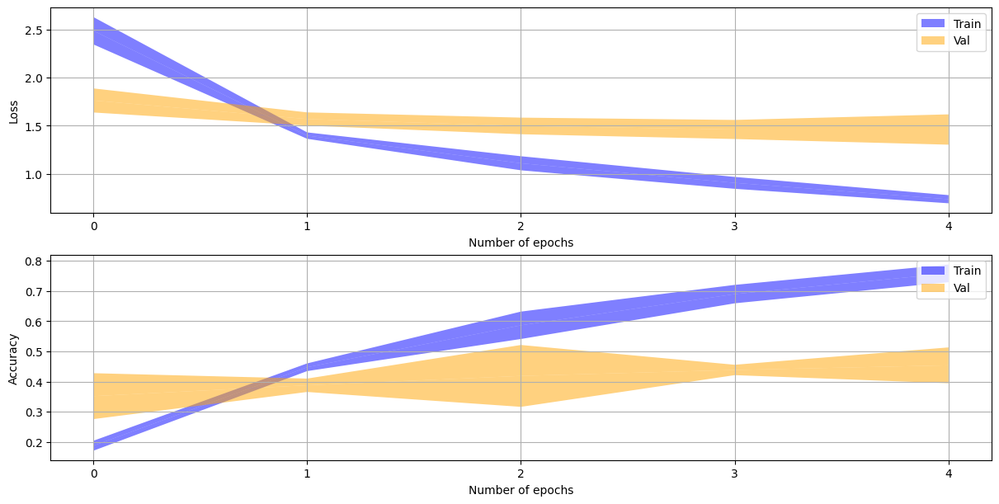

In [67]:
fig, axs = plt.subplots(2, 1, constrained_layout=True, figsize=(12,6))

plot_kfold_mean_performance(axs[0], train_losses, val_losses, "Loss")
plot_kfold_mean_performance(axs[1], train_accuracies, val_accuracies, "Accuracy")

print(f'Train loss: {np.mean(np.array(train_losses)[:, -1])}')
print(f'Train accuracy: {np.mean(np.array(train_accuracies)[:, -1])}')
print(f'Validation loss: {np.mean(np.array(val_losses)[:, -1])}')
print(f'Validation accuracy: {np.mean(np.array(val_accuracies)[:, -1])}')

In [73]:
def calculate_f1_score(conf_mat):
    f1_scores = []
    for i in range(conf_mat.shape[0]):
        TP = conf_mat[i, i]
        FP = np.sum(conf_mat, axis=0)[i] - TP
        FN = np.sum(conf_mat, axis=1)[i] - TP
        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        f1_score = 2 * (precision * recall) / (precision + recall)
        f1_scores.append(f1_score)
        print("F1-score", QUERIES[i], ":", f1_score)
    weighted_f1_score = np.average(f1_scores, weights=np.sum(conf_mat, axis=1))
    return weighted_f1_score

In [74]:
import sklearn.metrics as me

test_images = open_images(test_df['path'].values)
label_encoder = LabelEncoder()
label_encoder.fit(test_df['label'].values)
test_labels = label_encoder.transform(test_df['label'].values)      # labels from test_datasets

pred = model.predict(test_images)
pred = np.argmax(pred, axis=-1)

test_confusion_matrix = me.confusion_matrix(test_labels, pred, labels=np.arange(len(QUERIES)))

C:\Users\camko\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\PIL\Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step


## Confusion matrix and F1-Score

F1-score Chess King : 0.5555555555555556
F1-score Chess Queen : 0.20689655172413793
F1-score Chess Rook : 0.7499999999999999
F1-score Chess Bishop : 0.8181818181818182
F1-score Chess Knight : 0.13333333333333333
F1-score Chess Pawn : 0.6
Model F1-score : 0.5106612097991409


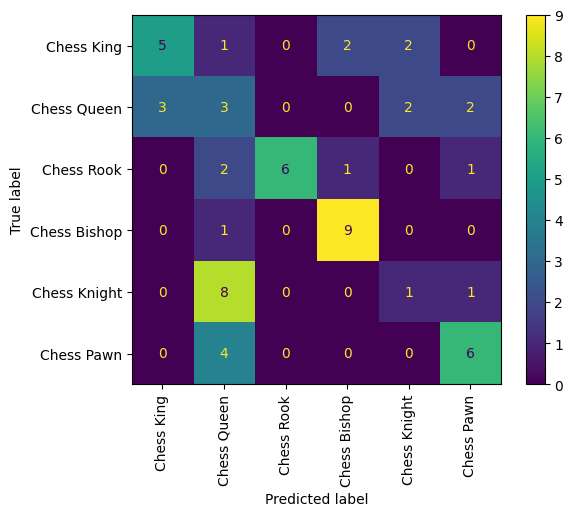

In [75]:
print("Model F1-score :", calculate_f1_score(test_confusion_matrix))

confusion_matrix_display = me.ConfusionMatrixDisplay(
    confusion_matrix=test_confusion_matrix,
    display_labels=QUERIES,
)
confusion_matrix_display.plot(xticks_rotation='vertical')
plt.show()

## Evaluate model on test set

### Display some misclassified images

**TODO**: display some misclassified images to be able to see what images are difficult for the model

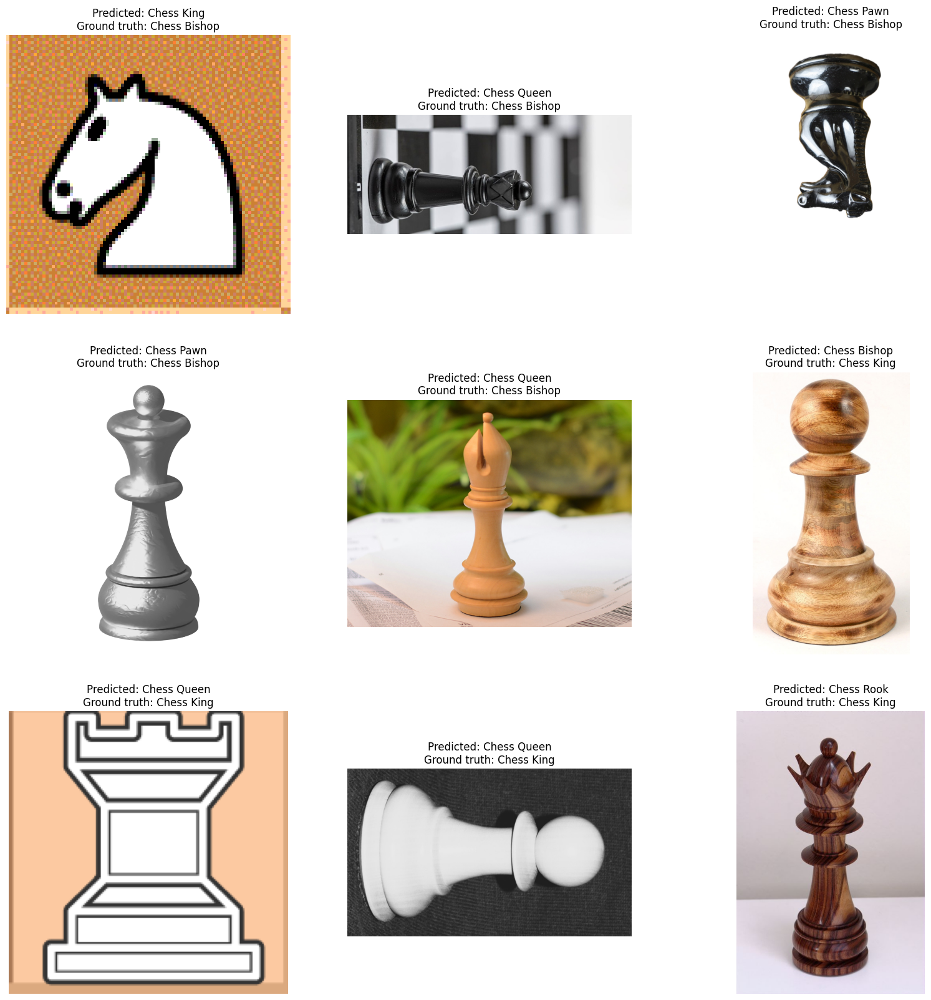

In [78]:
import matplotlib.pyplot as plt
import PIL.Image

# Définir QUERIES comme le mapping des indices de labels aux classes
QUERIES = label_encoder.classes_

plt.figure(figsize=(20, 20))
i = 0

for x in range(len(test_labels)):
    if(pred[x] != test_labels[x]):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(PIL.Image.open(test_paths[x]))
        plt.title("Predicted: " + QUERIES[pred[x]] + "\nGround truth: " + QUERIES[test_labels[x]])
        plt.axis("off")
        i += 1
        if i >= 9:  # Limiter à 9 images
            break
plt.show()

## Use grad-cam to inspect how the model classify
Here we can see an heatmap of the regions that activates the model the most.

### For more information:
- tf-keras-vis documentation: https://keisen.github.io/tf-keras-vis-docs/
- Grad-cam paper: https://arxiv.org/pdf/1610.02391.pdf
- Grad-cam++ paper: https://arxiv.org/pdf/1710.11063.pdf

**NOTE**: maybe you will need to adapt some variable names based on your code above. For example, _model_ should be the model trained on all the training data. 

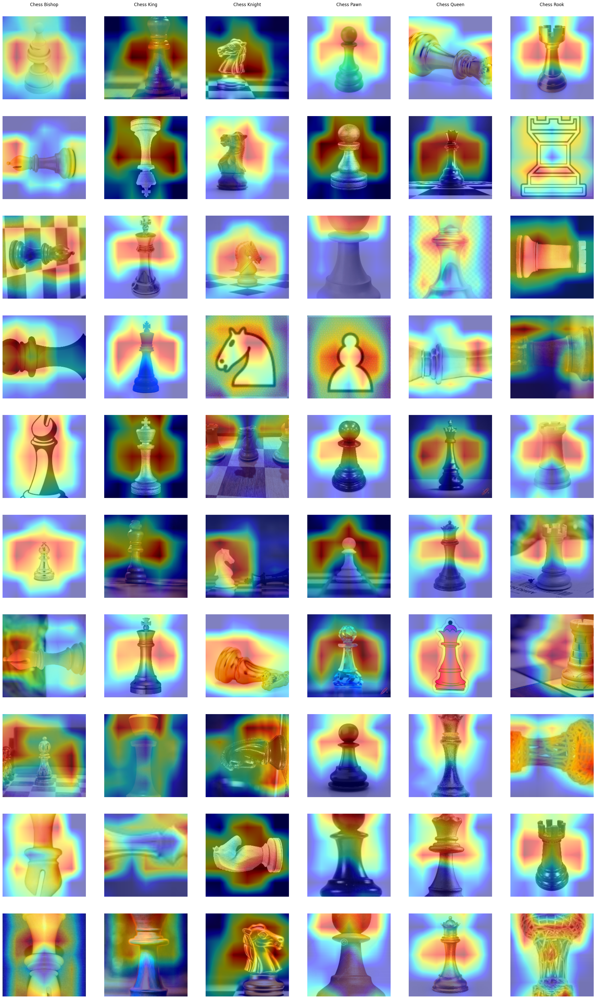

In [82]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from tensorflow.keras.applications import MobileNetV2
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

# Create GradCAM++ object
gradcam = GradcamPlusPlus(
    model,
    model_modifier=ReplaceToLinear(),
    clone=True,
)

nb_images_per_class = 10

fig, axs = plt.subplots(nb_images_per_class, len(LABEL_NAMES), figsize=(len(LABEL_NAMES) * 5, nb_images_per_class * 5))

for label_idx, label_name in enumerate(LABEL_NAMES):
    axs[0,label_idx].set_title(label_name, loc='center', y=1.1)
    
    i = 0
    for _, rowdata in train_df[train_df['label'] == label_name].sample(frac=1).head(nb_images_per_class).iterrows():
        img = open_image(rowdata.path)    
        pred = model(np.expand_dims(img, axis=0))

        # Generate cam with GradCAM++
        score = CategoricalScore(np.argmax(pred))
        cam = gradcam(score, img)
        heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)

        axs[i,label_idx].imshow(img, vmin=0, vmax=1)
        axs[i,label_idx].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
        axs[i,label_idx].axis("off")

        i += 1

### Grad-cam on misclassified images

**TODO**: now do the same than above, but with the misclassified images. You shouldn't change anything pertaining to grad-cam besides on which image and prediction you do it

**TODO**: try to determine what caused the misclassifcations and what you can do about it

C:\Users\camko\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\PIL\Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


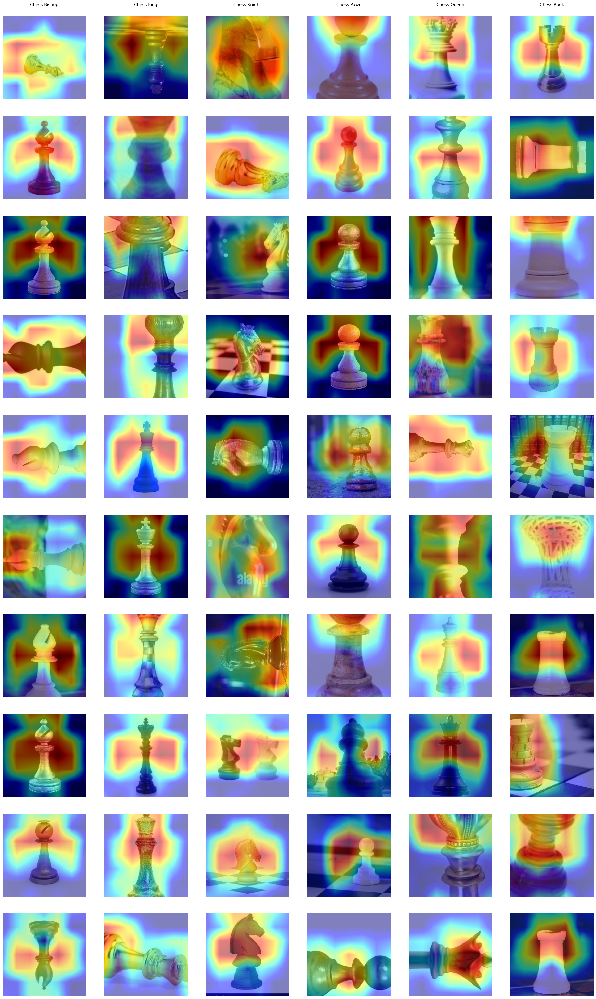

In [83]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from tensorflow.keras.applications import MobileNetV2
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore


gradcam = GradcamPlusPlus(
    model,
    model_modifier=ReplaceToLinear(),
    clone=True,
)

nb_images_per_class = 10

fig, axs = plt.subplots(nb_images_per_class, len(LABEL_NAMES), figsize=(len(LABEL_NAMES) * 5, nb_images_per_class * 5))

for label_idx, label_name in enumerate(LABEL_NAMES):
    axs[0,label_idx].set_title(label_name, loc='center', y=1.1)
    
    i = 0
    for _, rowdata in train_df[train_df['label'] == label_name].sample(frac=1).head(nb_images_per_class).iterrows():
        img = open_image(rowdata.path)    
        pred = model(np.expand_dims(img, axis=0))

        # Generate cam with GradCAM++
        score = CategoricalScore(np.argmax(pred))
        cam = gradcam(score, img)
        heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)

        axs[i,label_idx].imshow(img, vmin=0, vmax=1)
        axs[i,label_idx].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
        axs[i,label_idx].axis("off")

        i += 1

fig.savefig('temp.png', dpi=fig.dpi)

In [85]:
model.save('final_model.keras') 